In [1]:
import os
import cv2
from PIL import Image
from IPython.display import display
import numpy as np
import math

Идея зкалючалась в том, что мы будем распознавать не два символа, а лишь один, либо арабский знак, либо латинские буквы с западными арабскими цифрами. Для этого планировалось выделить определенную область на номере


In [2]:
train_dir = 'test_task/train'
files = os.listdir(train_dir)
names = list()
for file in files:
    if file.split('.')[1] in ['jpeg', 'jpg', 'png']:
        names.append(file)

## Подход 1
Заключает в обрезании верхней/нижней части номера

In [3]:
def half_crop(img, down=True):
    if down:
        return img[img.shape[0] // 2:img.shape[0], :]
    else:
        return img[0:img.shape[0] // 2, :]

down


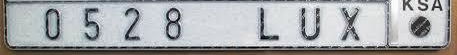

up


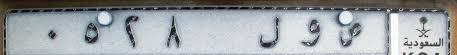

down


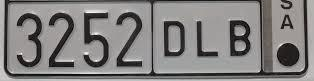

up


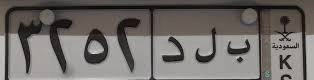

down


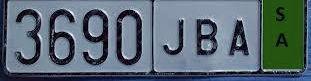

up


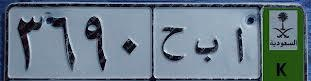

down


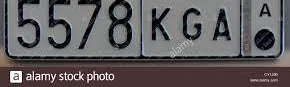

up


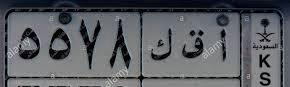

down


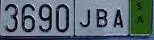

up


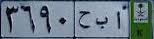

down


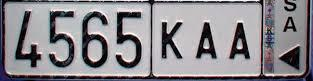

up


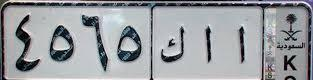

down


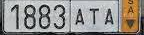

up


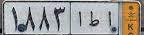

down


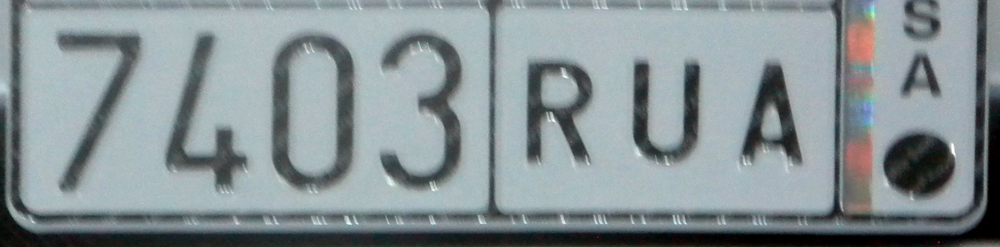

up


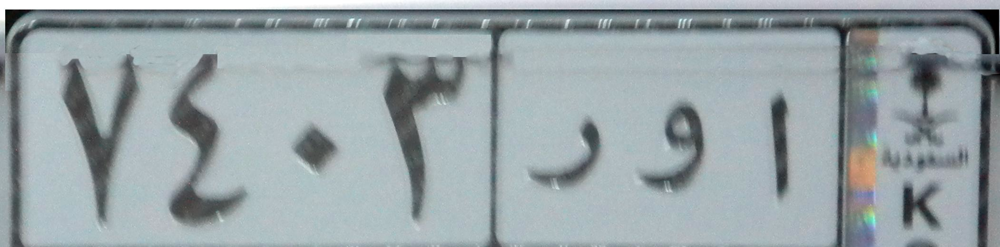

down


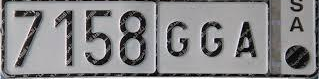

up


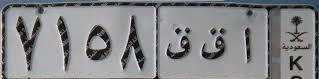

down


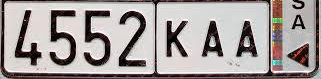

up


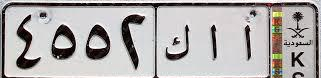

In [4]:
for i in range(10):
    img = cv2.imread(os.path.join(train_dir, names[i]))
    print('down')
    display(Image.fromarray(half_crop(img, down=True)))
    print('up')
    display(Image.fromarray(half_crop(img, down=False)))

## Подход 2 
основан на построении контуров и делении номера на 5 частей и последющем выборе области. 
В идеале контур должнен получиться так:
![example](images/example.png) 

In [5]:
def custom_sort(countour):
    return -countour.shape[0]

In [7]:
def hyp(points):
    return math.sqrt((points[-1][0][0] - points[0][0][0])**2 + (points[-1][0][1] - points[0][0][1])**2)

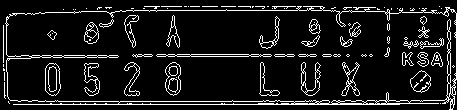

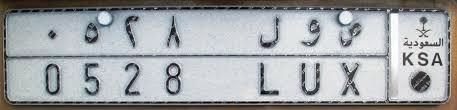

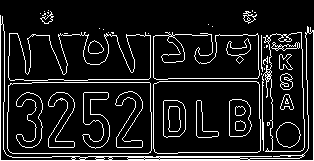

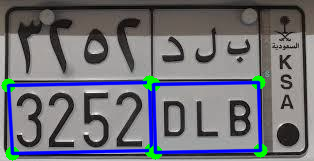

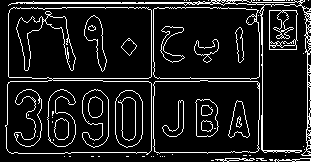

...

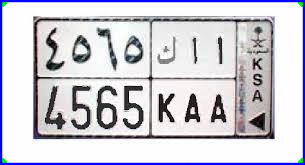

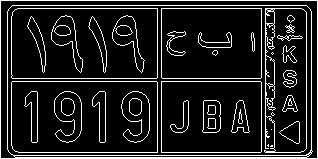

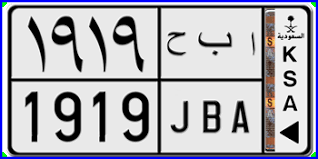

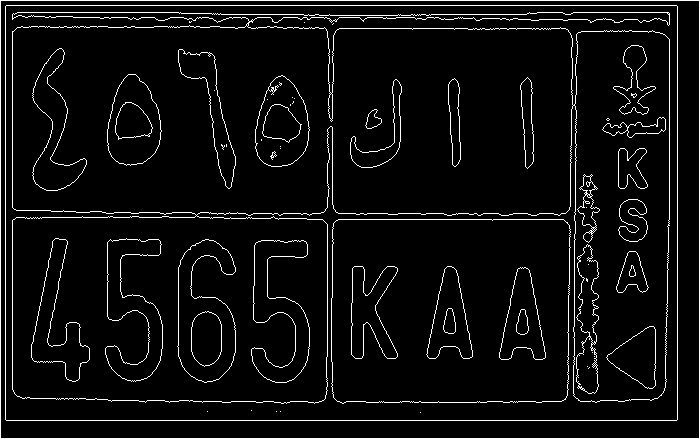

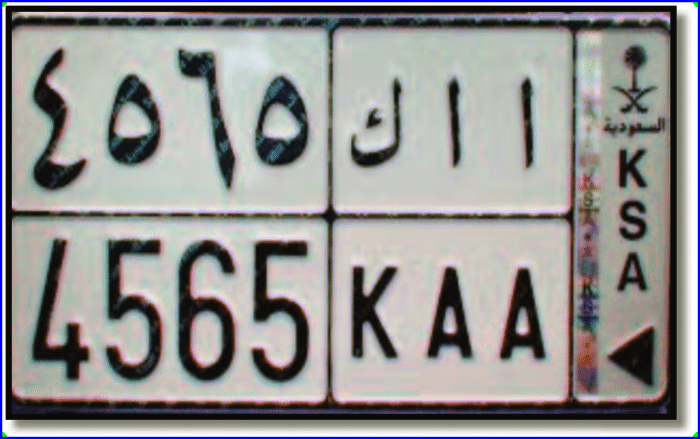

In [8]:
for i in range(20):
    img = cv2.imread(os.path.join(train_dir, names[i]))
    img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    thresh = 100

    ret,thresh_img = cv2.threshold(img_grey, thresh, 255, cv2.THRESH_BINARY)
    
    contours, hierarchy = cv2.findContours(thresh_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    img_contours = np.uint8(np.zeros((img.shape[0],img.shape[1])))
    
    cv2.drawContours(img_contours, contours, -1, (255,255,255), 1)
    display(Image.fromarray(img_contours))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = 100

    ret, thresh_img = cv2.threshold(gray, thresh, 255, cv2.THRESH_BINARY)
    
    # find contours without approx
    contours,_ = cv2.findContours(thresh_img,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
    contours=list(contours)
    contours.sort(key=custom_sort)
    canvas = img.copy()
    for sel_countour in contours:
        arclen = cv2.arcLength(sel_countour, True)
    
        # do approx
        eps = 0.1
        epsilon = arclen * eps
        approx = cv2.approxPolyDP(sel_countour, epsilon, True)
        if approx.shape[0] not in [4]:
            continue
        if hyp(approx) < hyp([[[0,0]],[[img.shape[0], img.shape[1]]]]) // 5:
            continue
    
        for pt in approx:
            cv2.circle(canvas, (pt[0][0], pt[0][1]), 7, (0,255,0), -1)
    
        cv2.drawContours(canvas, [approx], -1, (0,0,255), 2, cv2.LINE_AA)
    
        img_contours = np.uint8(np.zeros((img.shape[0],img.shape[1])))
        cv2.drawContours(img_contours, [approx], -1, (255,255,255), 1)
    
    display(Image.fromarray(canvas))

После некоторого анализа изображений, я выяснил что изначальная задумка была ошибочной, т.к. на некоторых изображениях виден арабский символ, а например латинская буква под ним размыта и поэтому лучше их не разделять.
Пример такого изображения (арабских знаков не видно, а латинские видно достаточно хорошо):
![example](images/example1.png) 
Поэтому от настройки более точного контура как и от всей этой задумки я отказался 